In [50]:
import pandas as pd
import numpy as np

In [51]:
X_train  = pd.read_csv('X_train.csv',index_col='id')


In [52]:
print(X_train)

       x0   x1   x2   x3   x4   x5   x6   x7   x8   x9  ...  x17803  x17804  \
id                                                      ...                   
0     215  210  200  184  159  131  107   87   61   38  ...     NaN     NaN   
1      56   53   50   47   42   38   34   30   26   23  ...     NaN     NaN   
2     -65  -63  -61  -59  -57  -55  -52  -49  -46  -44  ...     NaN     NaN   
3      38   67  100  131  161  191  219  249  267  275  ...     NaN     NaN   
4    -291 -279 -261 -224 -148  -64   11   66   71   42  ...     NaN     NaN   
5     -33  -32  -32  -31  -30  -29  -28  -28  -28  -28  ...     NaN     NaN   
6     -88  -86  -85  -83  -82  -80  -79  -77  -75  -72  ...     NaN     NaN   
7      -8   -6   -5   -3   -1    0    1    2    4    7  ...     NaN     NaN   
8      16   12    8    4    1    0   -1   -2   -3   -5  ...     NaN     NaN   
9     119  104   94   59   15  -35  -90 -118 -128 -132  ...     NaN     NaN   
10    -19  -18  -18  -17  -17  -17  -17  -17  -17  -

In [53]:
y_train = pd.read_csv('y_train.csv',index_col='id')

In [54]:
y_train_stat = y_train.groupby('y').size()

In [55]:
print(y_train.shape)

(5117, 1)


In [56]:
y_train_stat.colmuns = ['y','recordings']
print(y_train_stat)

y
0    3030
1     443
2    1474
3     170
dtype: int64


In [93]:
import pylab as pl
from pylab import rcParams
from biosppy import storage
from biosppy.signals import ecg

rcParams['figure.figsize'] = 60,10

In [94]:
#df = df.fillna(0)

In [95]:
signal,mdata = storage.load_txt('ecg.txt')
Fs = mdata['sampling_rate']

In [116]:
def dist(ts1, ts2):
    '''
    Input: two vectors
    Output: distance, numeric
    '''
    dist_num = np.linalg.norm(np.array(ts1) - np.array(ts2))
    return dist_num

In [128]:
def find_centerwave(templates):
    n_short = len(templates)
    dist_mat = np.zeros([n_short, n_short])
    for i in range(n_short):
        dist_mat[i, i] = 0.0
        for j in range(i+1, n_short):
            tmp_dist = dist(templates[i], templates[j])
            dist_mat[i, j] = tmp_dist
            dist_mat[j, i] = tmp_dist

    dist_mat_dist = np.sum(dist_mat, axis=1)
    centerwave = templates[np.argsort(dist_mat_dist)[0]]
    return centerwave

In [124]:
y_0 = y_train.loc[y_train['y'] == 0]
y_1 = y_train.loc[y_train['y'] == 1]
y_2 = y_train.loc[y_train['y'] == 2]
y_3 = y_train.loc[y_train['y'] == 3]

X_0 = X_train.loc[y_train['y'] == 0]
X_1 = X_train.loc[y_train['y'] == 1]
X_2 = X_train.loc[y_train['y'] == 2]
X_3 = X_train.loc[y_train['y'] == 3]

print(len(y_0))
print(len(y_1))
print(len(y_2))
print(len(y_3))

3030
443
1474
170


0


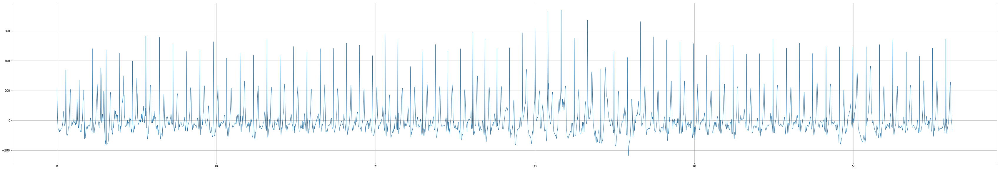

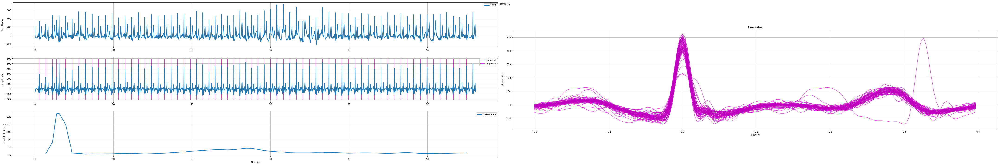

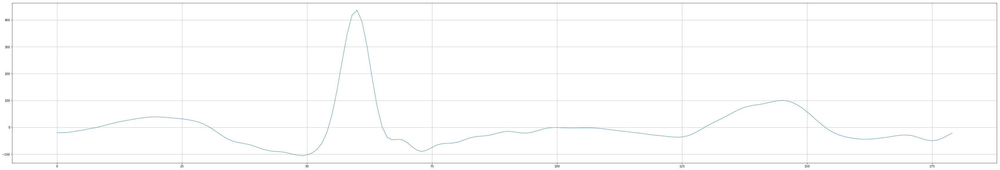

0


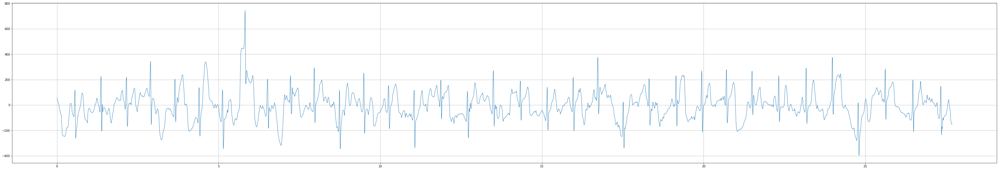

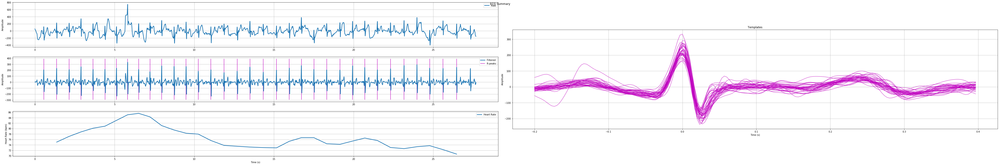

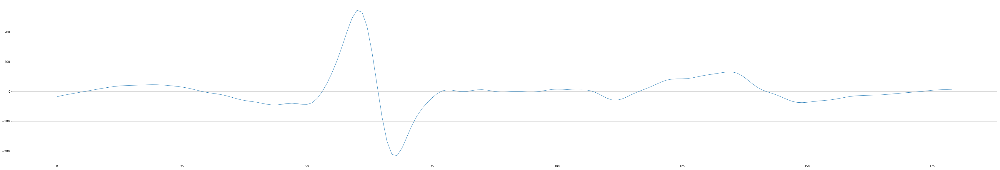

0


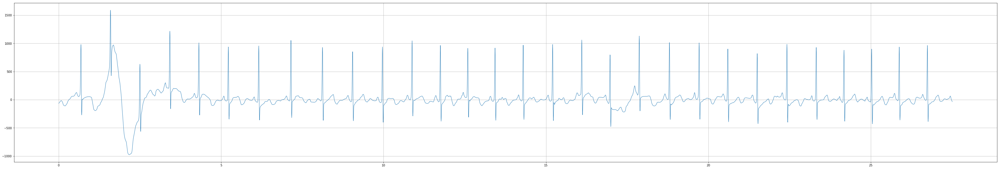

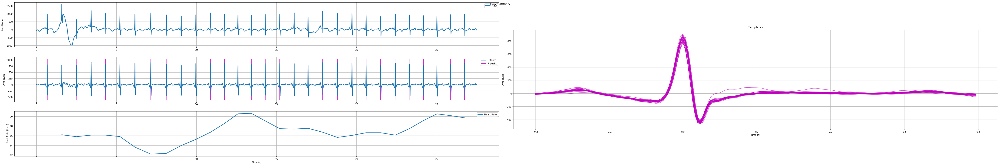

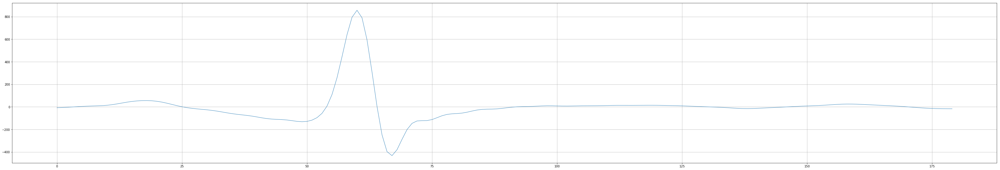

0


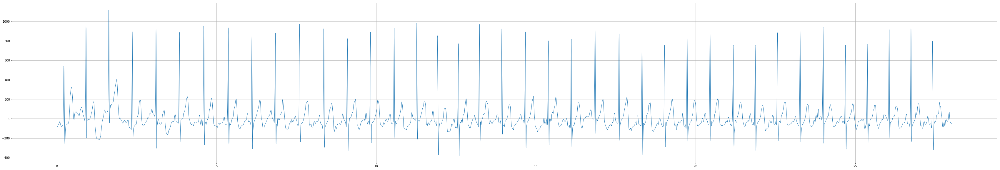

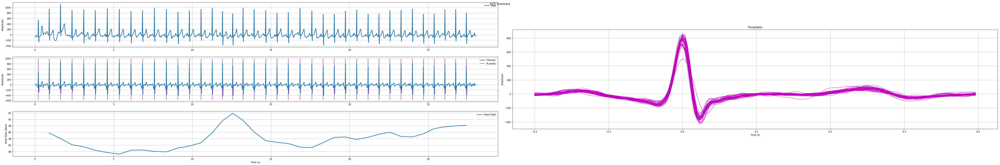

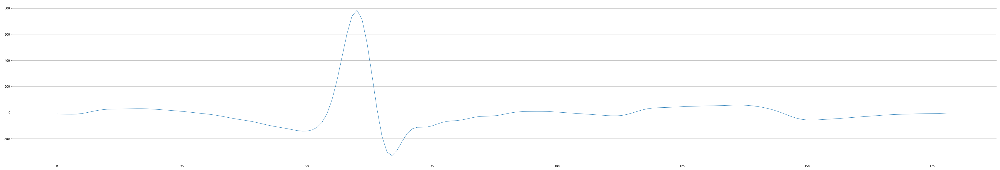

1


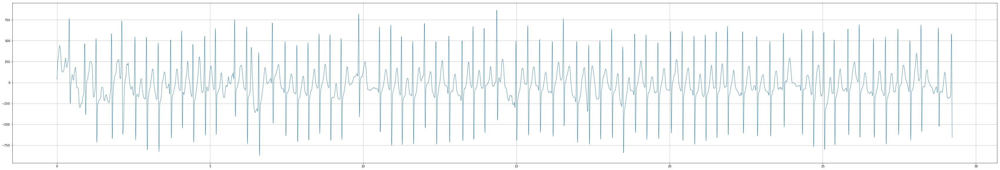

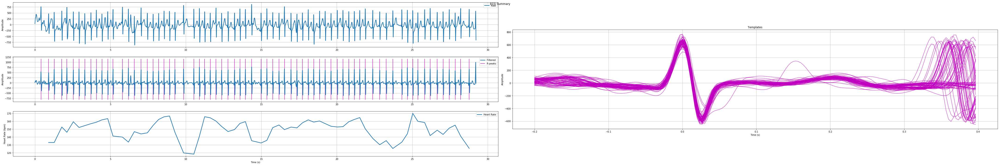

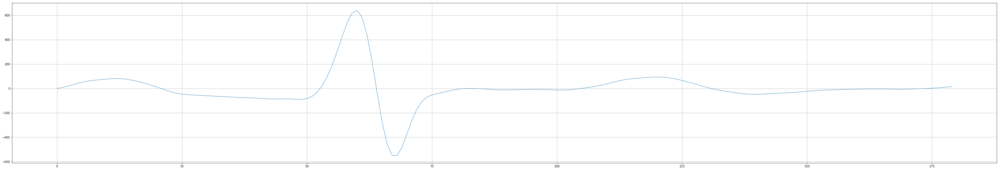

1


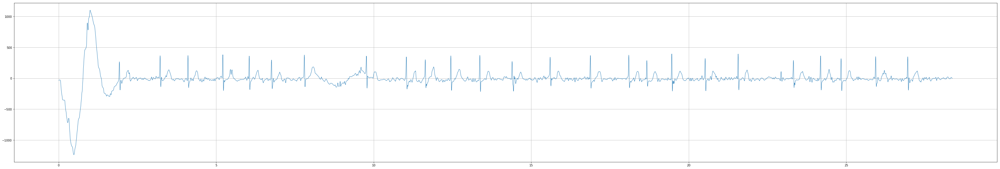

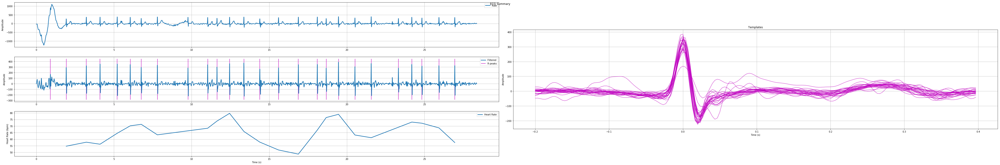

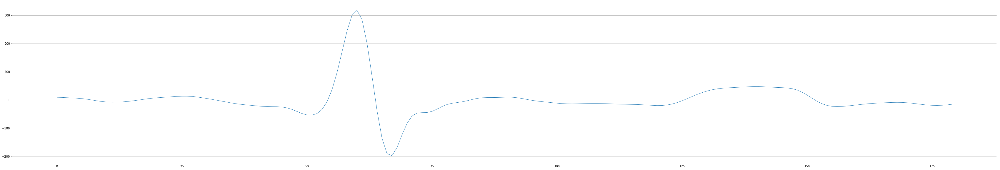

1


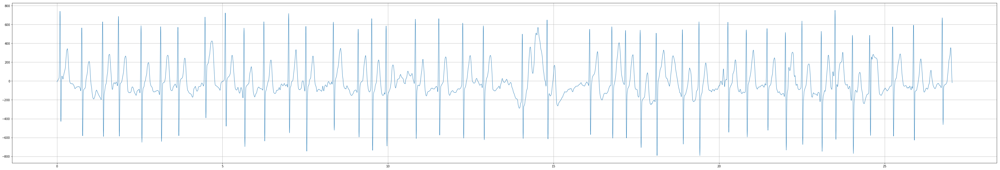

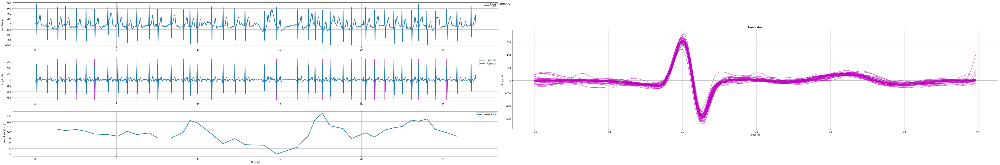

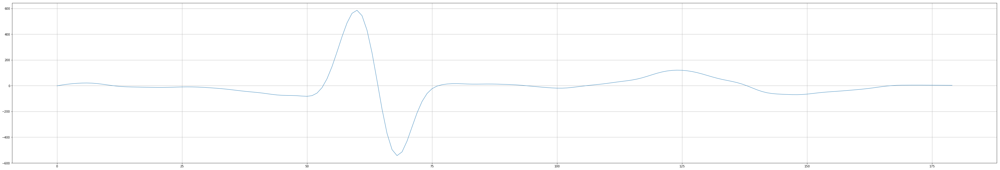

1


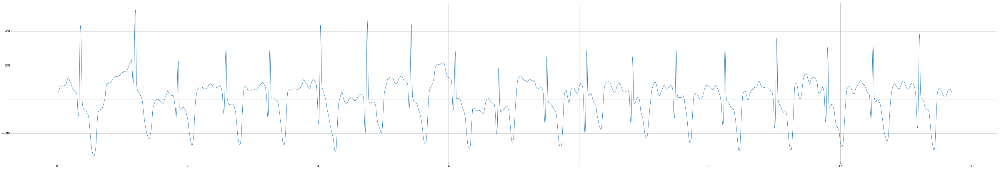

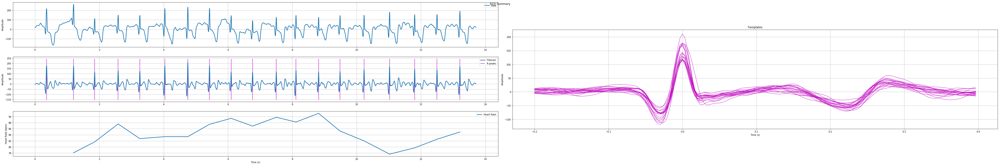

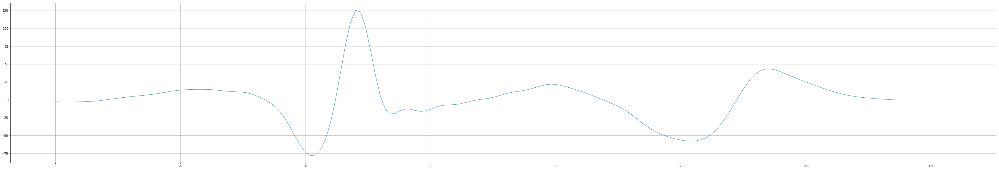

2


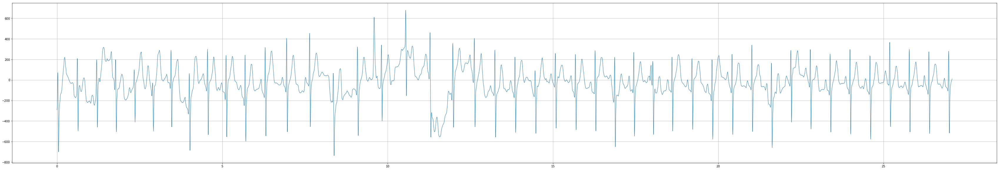

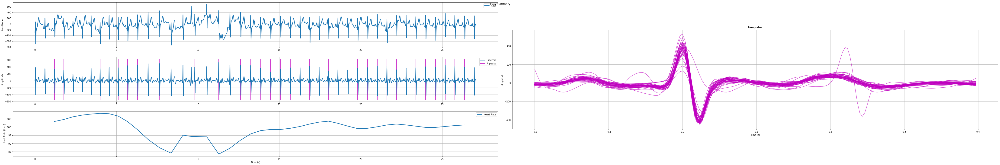

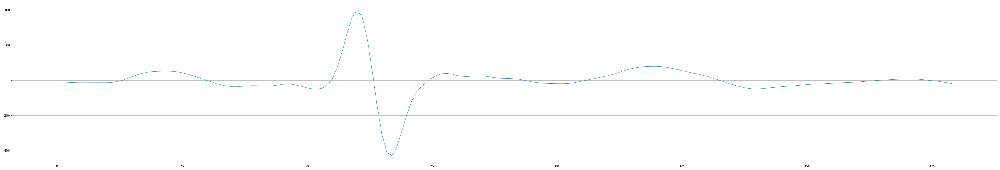

2


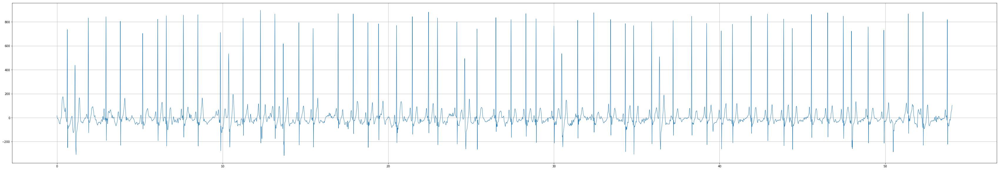

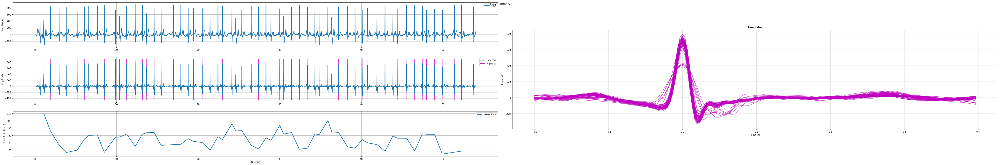

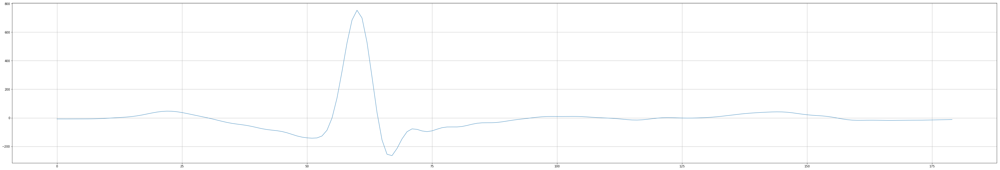

2


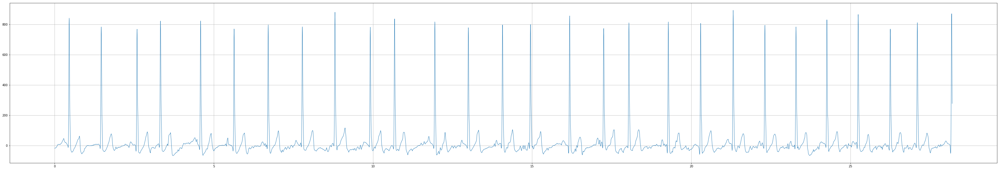

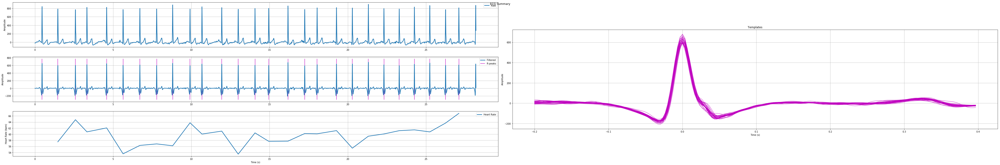

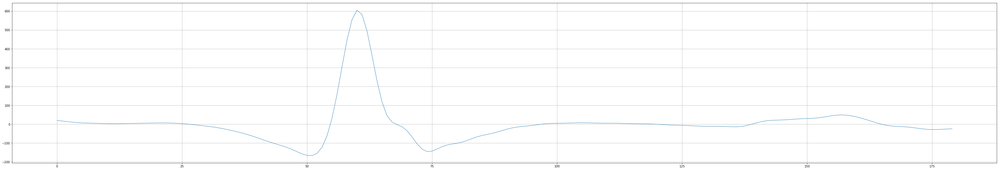

2


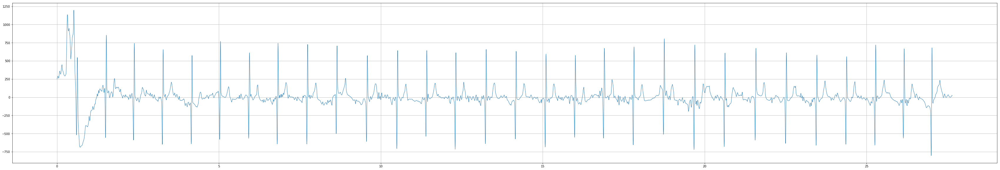

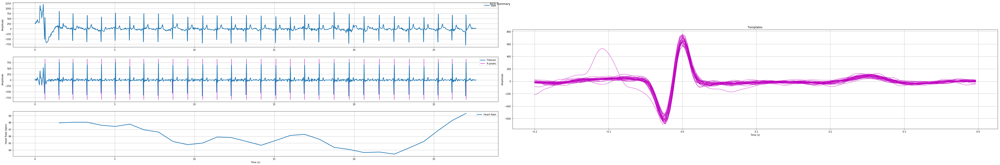

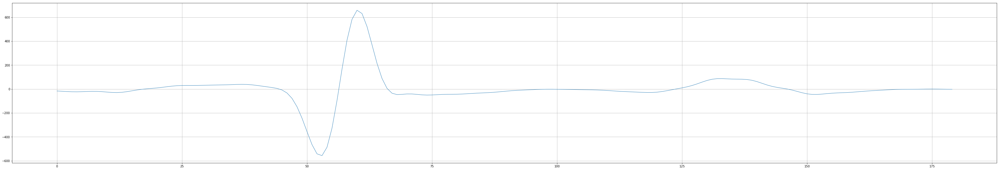

3


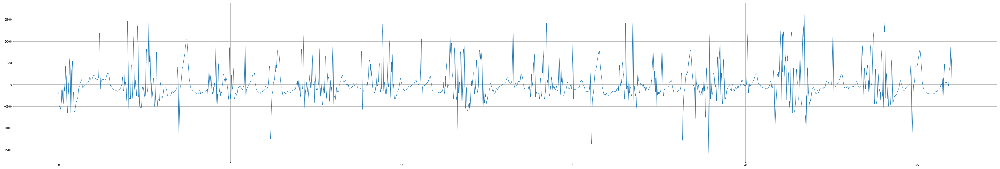

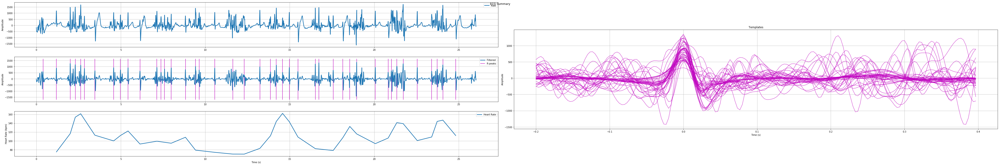

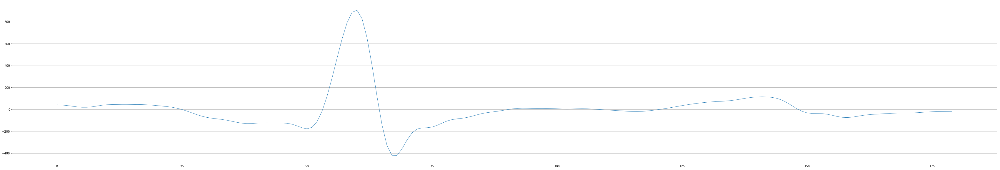

3


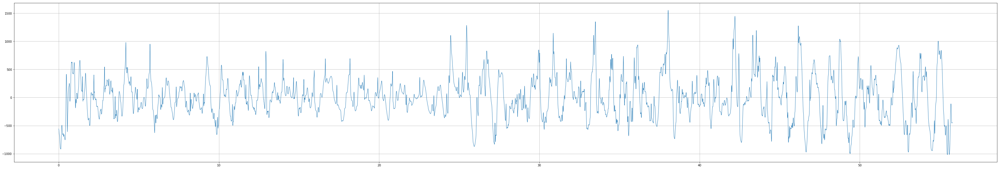

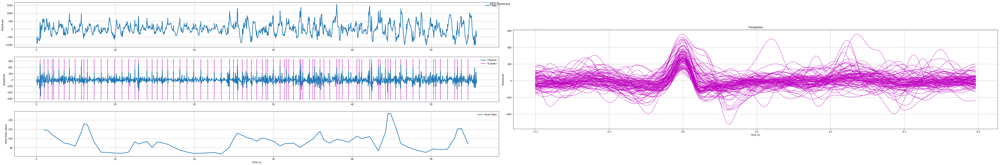

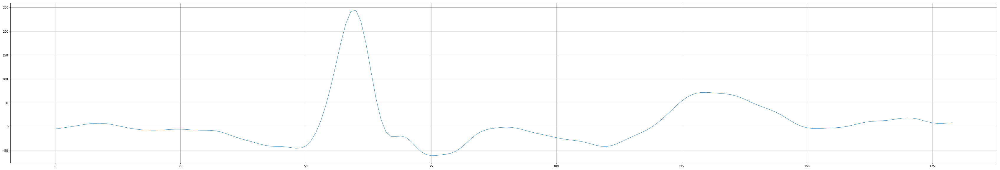

3


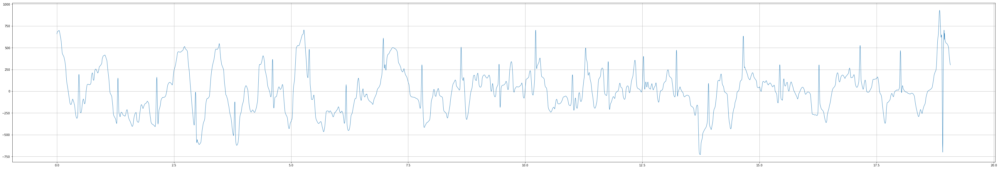

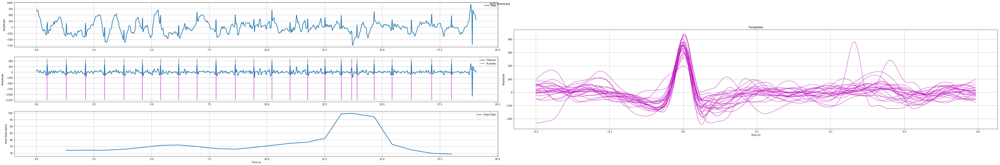

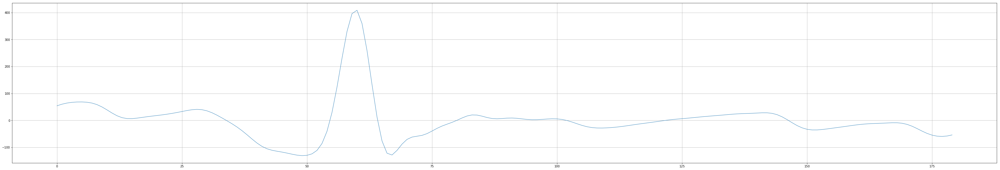

3


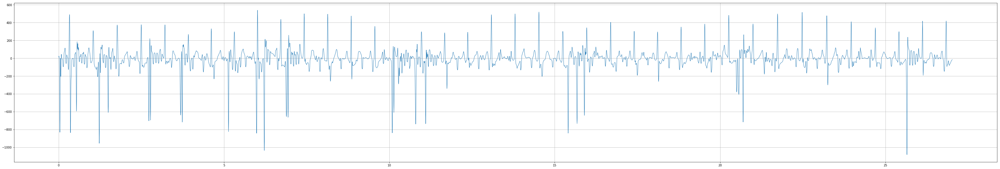

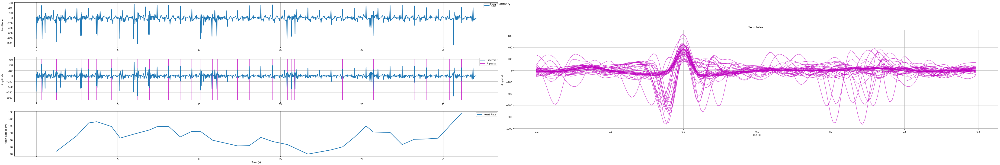

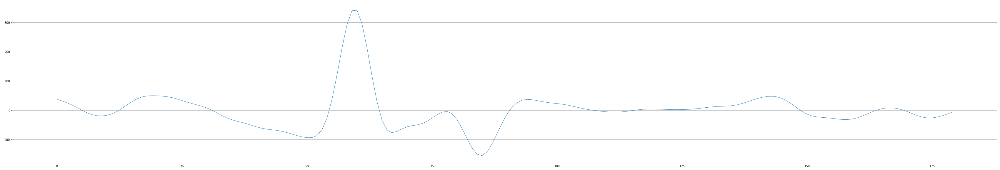

In [132]:
Fs = 300 # frequency signal
from dtaidistance import dtw
from dtaidistance import clustering


for j,X in enumerate([X_0,X_1,X_2,X_3]):
    for i in range(4):
        signal = X.iloc[i].to_numpy()
        N = len(signal)  # number of samples
        print(j)
        #print(N)
        T = (N - 1) / Fs  # duration
        ts = np.linspace(0, T, N, endpoint=False)  # relative timestamps
        pl.plot(ts, signal, lw=1)
        pl.grid() 
        pl.show()
        signal = signal[np.logical_not(np.isnan(signal))]
        out = ecg.ecg(signal=signal,sampling_rate=Fs)
        centerwave = find_centerwave(out['templates'])
        pl.plot(centerwave, lw=1)
        pl.grid() 
        pl.show()
        

        


        N_templates = len(out["templates"][0])
        print(N_templates)
        T_templates = (N_templates -1)/Fs
        ts_templates = np.linspace(0,T_templates,endpoint=False)
        len_templates = len(out['templates'])
        
        avg_template = out['templates'][0]
        for i in range(1,len_templates):
            avg_template += out['templates'][i]
        avg_template = avg_template/len_templates
        pl.plot(avg_template, lw=1)
        pl.grid() 
        pl.show()
        
        # Custom Hierarchical clustering
        model1 = clustering.Hierarchical(dtw.distance_matrix, {})
        # Keep track of full tree by using the HierarchicalTree wrapper class
        model2 = clustering.HierarchicalTree(model1)
        cluster_idx = model2.fit(out['templates'])
        model2.plot("hierarchy.png")